<a href="https://colab.research.google.com/github/thejokers8/AlzheimerDisease-3DCNN-Classifier/blob/main/3dCnnAnalysisWithClinica.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Install dependencies**

**Througout this project we used a fantastic tool to execute all the preprocessing needed to output proper image volumes for the CNN model used, this tool is called clinica and has tons of pipelines to treat neuroimaging.**

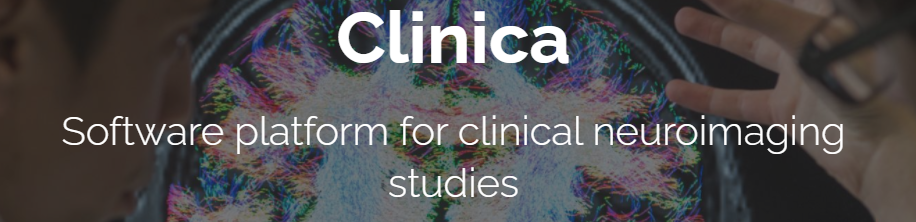

In [ ]:
! pip install clinica==0.3.8

In [ ]:
# !pip install clinicadl==0.2.1
!/bin/bash -c "$(curl -k https://aramislab.paris.inria.fr/files/software/scripts/install_conda_ants.sh)"
from os import environ
environ['ANTSPATH']="/usr/local/bin"

In [ ]:
import os
from os import path 
from nilearn import plotting

# **Check GPU**

In [ ]:
import tensorflow as tf
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 522280147585124125, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16183459840
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12304455809816455235
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

# **Mount Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Merge metadata**

####Within our dataset each subject could have multiple sessions and each session have different information for the same patient. When youŕe doing statistical analyes with tools like spm, ants and so on you need merge all individual files in a general larger TSV file

#REMINDER: Your dataset needs to be in BIDS format

In [ ]:
!clinica iotools merge-tsv drive/MyDrive/ADNIbids drive/MyDrive/CNN/merge.tsv

# **Missing modalities**

#### When you are working on a multimodal classifier, the same subject can have different scan modalities such as T1w, T2W, PET, DTI ... This line will give you a summary of the subjects and their sessions in which scanners are missing (in our case we only use T1W, but also this line informed us about the sessions that were empty

In [ ]:
!clinica iotools check-missing-modalities drive/MyDrive/ADNIbids drive/MyDrive/CNN/missing_mods

# **Get labels**
####Only when you are completely sure youre dataset has not missing modalities you going to extract the labels of your merged-TSV file

In [ ]:
!clinicadl tsvtool getlabels drive/MyDrive/CNN/merge.tsv drive/MyDrive/CNN/missing_mods drive/MyDrive/CNN/labels1 --diagnoses AD CN

# **Analyze population**

#### When you are working on a multimodal classifier, the same subject can have different scan modalities such as T1w, T2W, PET, DTI ... This line will give you a summary of the subjects and their sessions in which scanners are missing (in our case we only use T1W, but also this line informed us about the sessions that were empty

In [ ]:
!clinicadl tsvtool analysis drive/MyDrive/CNN/merge.tsv drive/MyDrive/CNN/labels1 drive/MyDrive/CNN/analysis.tsv --diagnoses AD CN

# **Splitting Dataset**
### Train-test split: There is our test cohort (8 subjects). since we are not working with MCI class nither MCI subclasses de MCI_sub_categories is activated

In [ ]:
!clinicadl tsvtool split drive/MyDrive/CNN/labels1 --n_test 8 --MCI_sub_categories

# **Subjects cross validation**
##We chose the amount of subject to check the accuracy throughout the CNN trainning

In [ ]:
!clinicadl tsvtool kfold drive/MyDrive/CNN/labels1/train --n_splits 1 --MCI_sub_categories

# **T1 linear on ADNI Dataset**

 **In order to have homogeneity, it's mandatory register each one of the sujects to a template, we register the subjects to the MNI152 template, this pipeline execute the following procedures:**

* Bias field correction
* Affine registration
* Image cropping

#REMINDER: When you're working with neuroimages we recommend center it in Anterior commisure and do non brain tissue extraction because in this way you can avoid noise

In [ ]:
!clinica run t1-linear drive/MyDrive/ADNIbids drive/MyDrive/CNN/ADNIcaps --n_procs 4 

**When you run that line of code your output should look like this, where you can see each subject analysis and when the pipeline run all the subjects available in your bids directory you'll see a message telling you t1-linear pipeline has completed, as shown below**

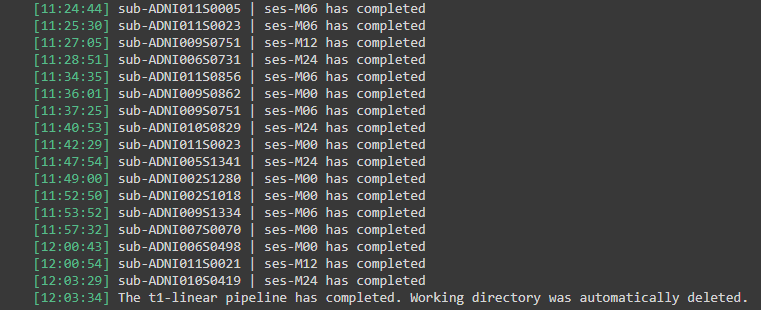

### **Check Data Quality**

In [ ]:
!clinicadl preprocessing quality-check t1-linear drive/MyDrive/CNN/ADNIcaps drive/MyDrive/CNN/QC_result.tsv

### **Tensor extraction**

In [ ]:
!clinica run deeplearning-prepare-data drive/MyDrive/CNN/ADNIcaps t1-linear image --n_procs 4s

vdsbgsfrbsfdsfdrbsdf

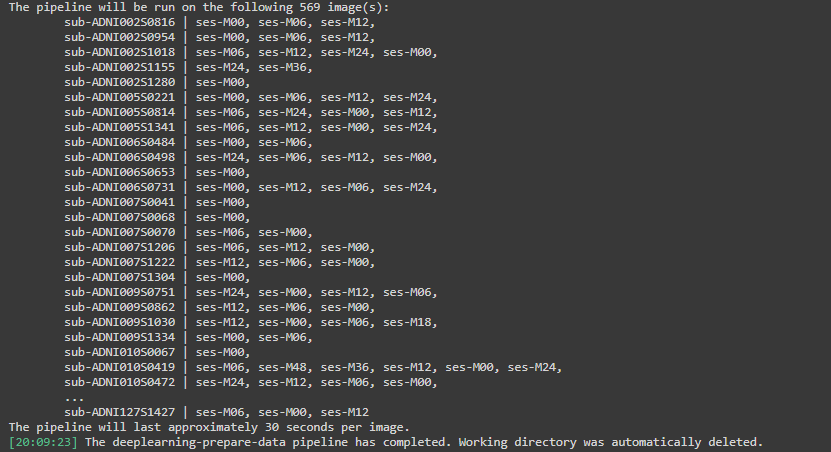

### **Check GPU**

In [ ]:
import torch

# Check if a GPU is available
print('GPU is available', torch.cuda.is_available())

GPU is available True


In [ ]:
!clinicadl train image cnn -h

usage: clinicadl train image cnn [-h] [--verbose] [-cpu] [-np NPROC]
                                 [--batch_size BATCH_SIZE]
                                 [--evaluation_steps EVALUATION_STEPS]
                                 [--multi_cohort]
                                 [--diagnoses {AD,BV,CN,MCI,sMCI,pMCI} [{AD,BV,CN,MCI,sMCI,pMCI} ...]]
                                 [--baseline] [--unnormalize]
                                 [--data_augmentation {None,Noise,Erasing,CropPad,Smoothing} [{None,Noise,Erasing,CropPad,Smoothing} ...]]
                                 [--sampler {random,weighted}]
                                 [--n_splits N_SPLITS]
                                 [--split SPLIT [SPLIT ...]] [--epochs EPOCHS]
                                 [--learning_rate LEARNING_RATE]
                                 [--weight_decay WEIGHT_DECAY]
                                 [--dropout DROPOUT] [--patience PATIENCE]
                                 [--tolerance T

### **Load Pretrained Model**

In [ ]:
!curl -k https://aramislab.paris.inria.fr/files/data/models/dl/models_v002/model_exp3_splits_1.tar.gz  -o model_exp3_splits_1.tar.gz
!tar xf model_exp3_splits_1.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  296M  100  296M    0     0  35.6M      0  0:00:08  0:00:08 --:--:-- 33.0M


### **Training with Pretrained model**

In [ ]:
!clinicadl train image cnn drive/MyDrive/CNN/ADNIcaps t1-linear drive/MyDrive/CNN/labels1/train drive/MyDrive/CNN/results/image_cnn1 Conv5_FC3 --n_splits 1 --transfer_learning_path model_exp3_splits_1 --diagnoses AD CN --epochs 10 -v

2021-05-13 20:45:53,726 - main process - Path of json file: results/image_cnn1/commandline.json
2021-05-13 20:45:54,090 - main process - Fold 0
2021-05-13 20:45:54,379 - main process - Initialization of the model
2021-05-13 20:46:01,633 - main process - A pretrained CNN is loaded at path model_exp3_splits_1
2021-05-13 20:46:04,163 - train - Beginning epoch 0.
2021-05-13 20:50:01,997 - train - image level training accuracy is 0.927998 at the end of iteration 170
2021-05-13 20:50:01,998 - train - image level validation accuracy is 0.918820 at the end of iteration 170
2021-05-13 20:50:04,630 - train - Beginning epoch 1.
2021-05-13 20:51:46,233 - train - image level training accuracy is 0.985396 at the end of iteration 170
2021-05-13 20:51:46,234 - train - image level validation accuracy is 0.963955 at the end of iteration 170
2021-05-13 20:51:50,796 - train - Beginning epoch 2.
2021-05-13 20:53:32,960 - train - image level training accuracy is 0.990323 at the end of iteration 170
2021-05-

### **Test pretrained model**

In [ ]:
!clinicadl classify drive/MyDrive/CNN/ADNIcaps drive/MyDrive/CNN/labels/test/CN.tsv drive/MyDrive/CNN/results1/image_cnn1 testCN --nproc 4 --selection_metrics balanced_accuracy

/usr/local/lib/python3.7/dist-packages/clinicadl/tools/deep_learning/data.py:78: UserWarning: The diagnoses found in the DataFrame {'CN'} only corresponds to one class {0}. If you want to run a binary classification please change the labels involved.
  % (unique_diagnoses, unique_codes))


### **Interpretability**

In [ ]:
!clinicadl interpret individual drive/MyDrive/CNN/results1/image_cnn1 interpretAD --tsv_path drive/MyDrive/CNN/labels/test --caps_dir drive/MyDrive/CNN/ADNIcaps --diagnosis AD --selection best_balanced_accuracy --nifti_template drive/MyDrive/CNN/ADNIcaps/subjects/sub-ADNI002S0816/ses-M00/t1_linear/sub-ADNI002S0816_ses-M00_T1w_space-MNI152NLin2009cSym_desc-Crop_res-1x1x1_T1w.nii.gz

In [ ]:
def plot_interpretability_individual_maps(diagnosis, results, image_cnn, interpret):

    a = ''
    subjects_path = f"drive/MyDrive/CNN/{results}/{image_cnn}/fold-0/gradients/best_balanced_accuracy/{interpret}"
    subjects_list = [subject for subject in os.listdir(subjects_path) 
                     if path.isdir(path.join(subjects_path, subject))]
    print(f"Interpretability group maps of {diagnosis} images")
    for subject in subjects_list:
        print(subject)
        subjects_list2 = [subject for subject in os.listdir(f"drive/MyDrive/CNN/{results}/{image_cnn}/fold-0/gradients/best_balanced_accuracy/{interpret}/{subject}") 
                         ]
        if 'ses-M00' in subjects_list2:
            a = 'ses-M00'
        else:
            a = 'ses-M12'
        map_path = path.join(subjects_path, subject, a, "map.nii.gz")
        plotting.plot_stat_map(map_path, title=f"Saliency map of {subject}",
                               cut_coords=[-5.340576e-5, -15.50005, 10.99995], display_mode="ortho", threshold=0.001)
        plotting.plot_glass_brain(map_path, title=f"Glass brain map of {subject} (maximum intensity values)",
                                         threshold=0.00001, black_bg = False, display_mode="ortho")        
    plotting.show()

def plot_interpretability_group_maps(diagnosis, results, image_cnn, interpret):
    
    print(f"Interpretability group maps of {diagnosis} images")
    subjects_path = f"drive/MyDrive/CNN/{results}/{image_cnn}/fold-0/gradients/best_balanced_accuracy/{interpret}"
    map_path = path.join(subjects_path, "map.nii.gz")
    plotting.plot_stat_map(map_path, title=f"Saliency map of {diagnosis}",
                               cut_coords=[-5.340576e-5, -15.50005, 10.99995], threshold=-0.0001, black_bg = True)
    plotting.plot_glass_brain(map_path, title=f"Glass brain map of {diagnosis} (maximum intense values)",
                           threshold=0.00001, black_bg = False, display_mode="ortho")
    plotting.show()

### **Interpretability Pretraine Model**

### **Maps AD**

Saliency maps of AD images
sub-ADNI062S0793
sub-ADNI002S0816
sub-ADNI011S0183
sub-ADNI068S0109
sub-ADNI067S1185
sub-ADNI010S0829
sub-ADNI022S0219
sub-ADNI035S0341


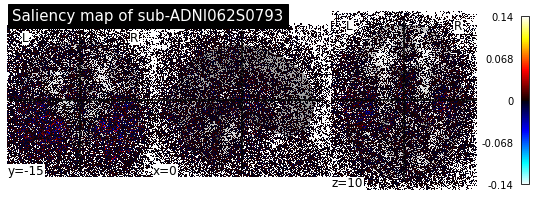

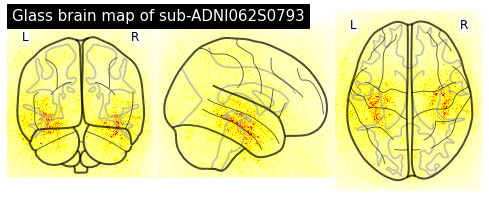

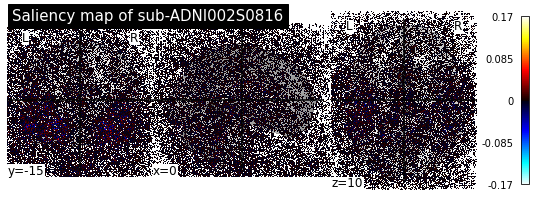

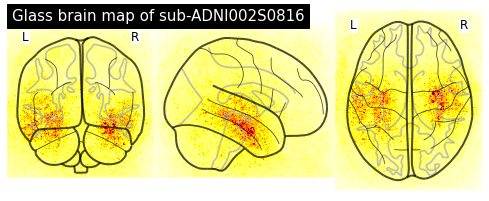

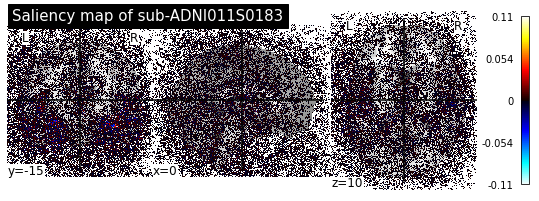

...

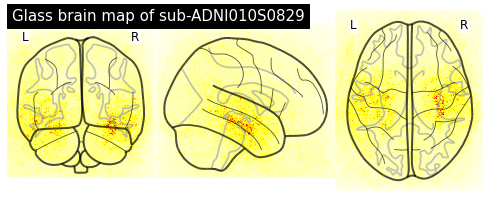

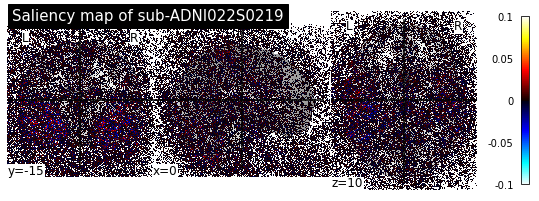

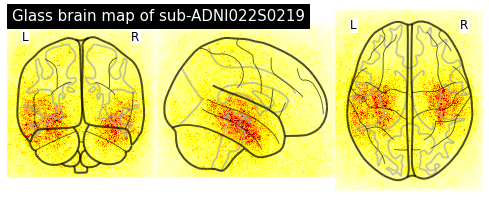

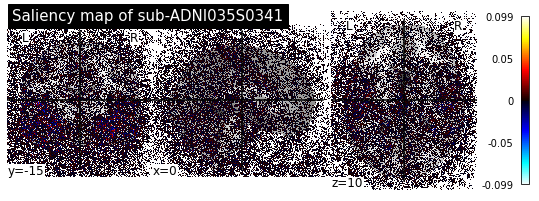

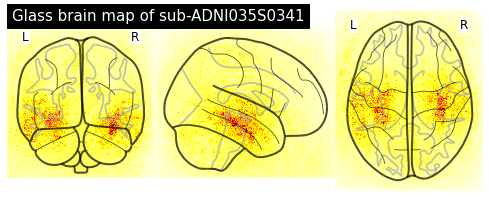

In [ ]:
plot_interpretability_individual_maps('AD', 'results1','image_cnn1','interpret')

Interpretability group maps of AD images


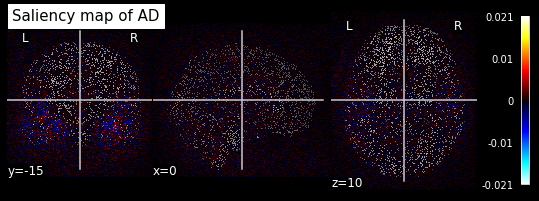

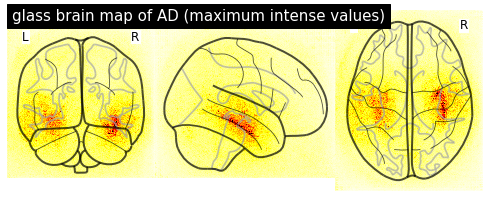

In [ ]:
plot_interpretability_group_maps('AD', 'results1','image_cnn1','interpret1')

### **Maps CN**

Interpretability group maps of CN images
sub-ADNI023S0963
sub-ADNI006S0484
sub-ADNI116S0648
sub-ADNI006S0498
sub-ADNI073S0386
sub-ADNI009S0751
sub-ADNI126S0506
sub-ADNI022S0066


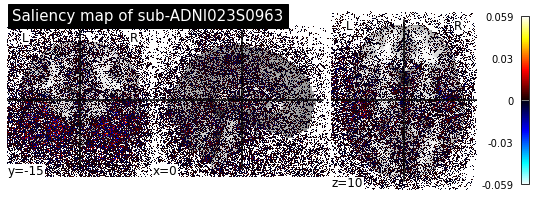

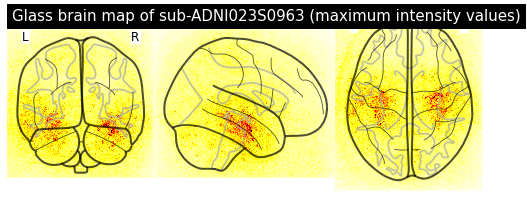

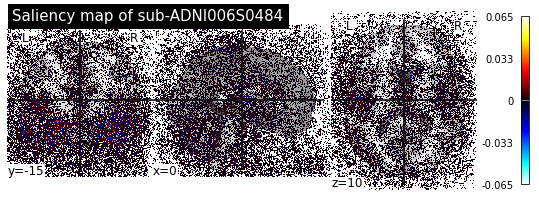

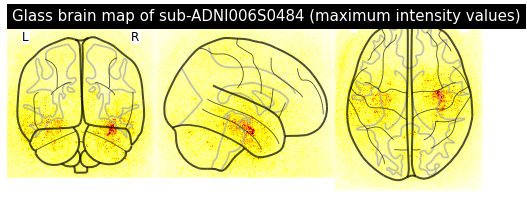

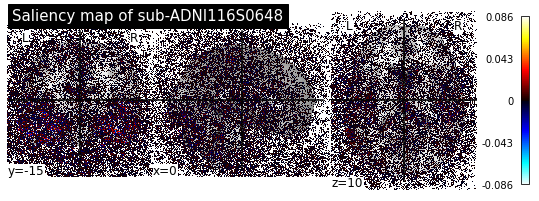

...

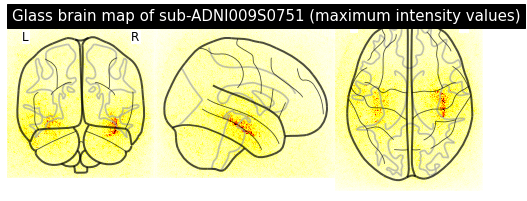

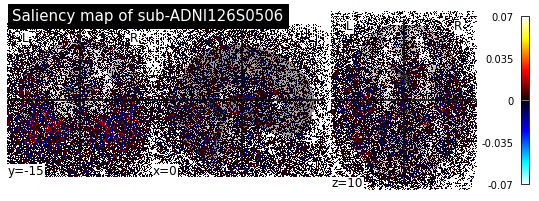

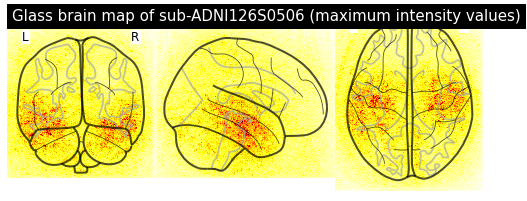

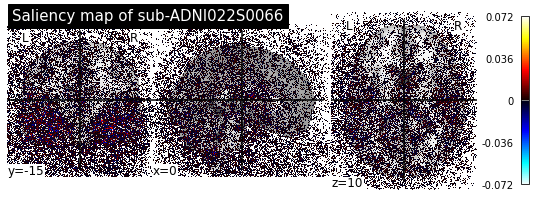

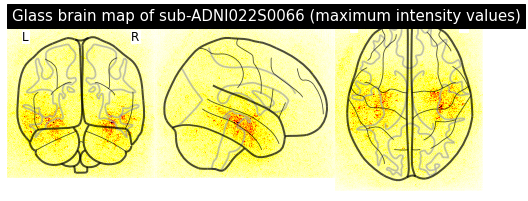

In [ ]:
plot_interpretability_individual_maps('CN', 'results1','image_cnn1','interpretCN1')

Interpretability group maps of CN images


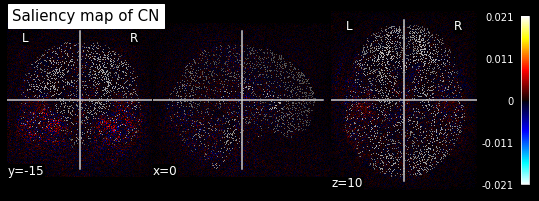

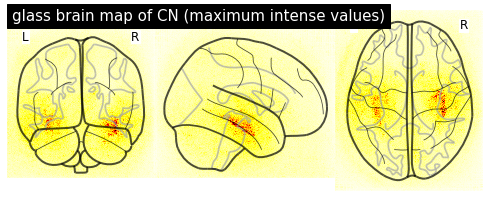

In [ ]:
plot_interpretability_group_maps('CN', 'results1','image_cnn1','interpretCN')

## **Metrics Pretrained model**

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import itertools
import csv
import numpy as np

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print(" Matrix de confusion Normalizada ")
    else:
        print('Matrix de confusion No Normalizada')

#    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Salida Deseada')
    plt.xlabel('Salida Estimada')

In [ ]:
def ExtractLabelsArray(resultsPath, ImagePath, Fold, LabelName):
  a = []
  q = 0
  p = 0
  c = open(f'drive/MyDrive/CNN/{resultsPath}/{ImagePath}/{Fold}/cnn_classification/best_balanced_accuracy/{LabelName}.tsv')
  read = csv.reader(c, delimiter = '\t')
  for row in read:
    print(row)
    a.append(row)

  r = list(a)
  this = np.zeros([len(r)-1,2])
  ww = 0

  for w in range(len(r)):
    for o in range(len(r[0])):
       if r[w][o] == '0' or r[w][o] == '1':
        this[q][p] = int(r[w][o])
        p+=1
        ww+=1
        if ww % 2 == 0:
         q+=1
         p-=2
  labels = this
  c.close()
  print(labels)
  return labels

In [ ]:
labelspretrain = ExtractLabelsArray('results1', 'fold-0', 'train_image_level_prediction')
labelspreval = ExtractLabelsArray('results1', 'fold-0', 'validation_image_level_prediction')

['participant_id', 'session_id', 'true_label', 'predicted_label']
['sub-ADNI067S0019', 'ses-M12', '0', '0']
['sub-ADNI062S0730', 'ses-M24', '1', '1']
['sub-ADNI027S1385', 'ses-M06', '1', '1']
['sub-ADNI032S0677', 'ses-M48', '0', '0']
['sub-ADNI018S0286', 'ses-M12', '1', '1']
['sub-ADNI036S1001', 'ses-M12', '1', '1']
['sub-ADNI011S0023', 'ses-M24', '0', '0']
['sub-ADNI126S0506', 'ses-M00', '0', '0']
['sub-ADNI002S1018', 'ses-M06', '1', '1']
['sub-ADNI006S0731', 'ses-M24', '0', '0']
['sub-ADNI109S1192', 'ses-M00', '1', '1']
['sub-ADNI068S0473', 'ses-M00', '0', '0']
['sub-ADNI057S0934', 'ses-M00', '0', '0']
['sub-ADNI123S0088', 'ses-M06', '1', '1']
['sub-ADNI006S0731', 'ses-M06', '0', '0']
['sub-ADNI072S0315', 'ses-M12', '0', '0']
['sub-ADNI009S0862', 'ses-M00', '0', '0']
['sub-ADNI033S0734', 'ses-M06', '0', '0']
['sub-ADNI009S0751', 'ses-M06', '0', '0']
['sub-ADNI007S1206', 'ses-M00', '0', '0']
['sub-ADNI009S0751', 'ses-M12', '0', '0']
['sub-ADNI010S0829', 'ses-M12', '1', '1']
['sub-ADNI

### **Train Data**

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


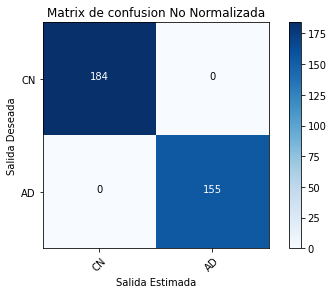

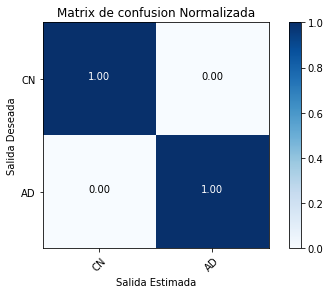

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix1 = confusion_matrix(labelspretrain[:,0], labelspretrain[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix1, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix1, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
def MetricsModel(MatrixName):
  
 Precision = MatrixName[0,0]/(MatrixName[0,0]+MatrixName[1,0])
 Precision1 = MatrixName[1,1]/(MatrixName[1,1]+MatrixName[0,1])

 Recall = MatrixName[0,0]/(MatrixName[0,0]+MatrixName[0,1])
 Recall1 = MatrixName[1,1]/(MatrixName[1,1]+MatrixName[1,0])

 F1CN = 2*((Precision*Recall)/(Precision+Recall))
 F1AD = 2*((Precision1*Recall1)/(Precision+Recall))

 print('Precision CN', Precision)
 print('Precision AD', Precision1)
 print('Recall CN:',Recall)
 print('Recall AD:',Recall1)
 print('f1 CN', F1CN)
 print('f1 AD', F1AD)

In [ ]:
MetricsModel(cnf_matrix1)

Precision CN 1.0
Precision AD 1.0
Recall CN: 1.0
Recall AD: 1.0
f1 CN 1.0
f1 AD 1.0


### **Validation Data**

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


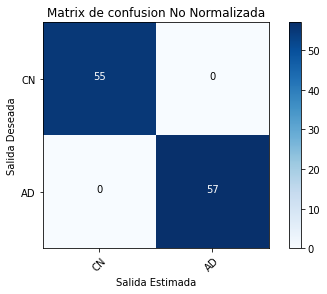

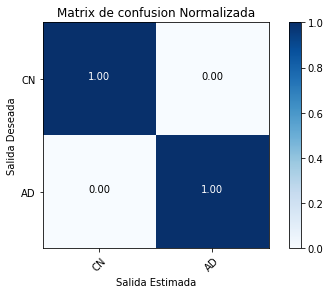

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix2 = confusion_matrix(labelspreval[:,0], labelspreval[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix2, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix2, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
MetricsModel(cnf_matrix2)

Precision CN 1.0
Precision AD 1.0
Recall CN: 1.0
Recall AD: 1.0
f1 CN 1.0
f1 AD 1.0


### **Test Data**

In [ ]:
labelstest1 = ExtractLabelsArray('results1','fold-0','testAD_image_level_prediction')
labelstest2 = ExtractLabelsArray('results1','fold-0','testCN_image_level_prediction')
labelspretest = np.concatenate((labelstest1,labelstest2),axis = 0)
print(labelspretest)

['participant_id', 'session_id', 'true_label', 'predicted_label']
['sub-ADNI011S0183', 'ses-M00', '1', '1']
['sub-ADNI011S0183', 'ses-M06', '1', '1']
['sub-ADNI011S0183', 'ses-M12', '1', '1']
['sub-ADNI011S0183', 'ses-M24', '1', '1']
['sub-ADNI035S0341', 'ses-M00', '1', '1']
['sub-ADNI035S0341', 'ses-M06', '1', '1']
['sub-ADNI010S0829', 'ses-M12', '1', '1']
['sub-ADNI010S0829', 'ses-M24', '1', '1']
['sub-ADNI062S0793', 'ses-M12', '1', '0']
['sub-ADNI062S0793', 'ses-M24', '1', '1']
['sub-ADNI002S0816', 'ses-M06', '1', '1']
['sub-ADNI002S0816', 'ses-M00', '1', '1']
['sub-ADNI002S0816', 'ses-M12', '1', '1']
['sub-ADNI068S0109', 'ses-M00', '1', '1']
['sub-ADNI068S0109', 'ses-M06', '1', '1']
['sub-ADNI068S0109', 'ses-M12', '1', '1']
['sub-ADNI068S0109', 'ses-M24', '1', '1']
['sub-ADNI067S1185', 'ses-M00', '1', '1']
['sub-ADNI067S1185', 'ses-M06', '1', '1']
['sub-ADNI022S0219', 'ses-M00', '1', '1']
[[1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 0.]
 [1. 1.]
 [1.

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


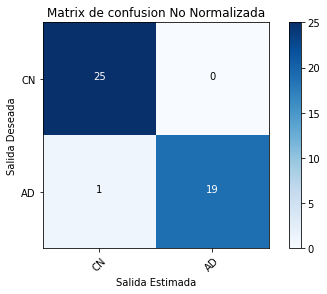

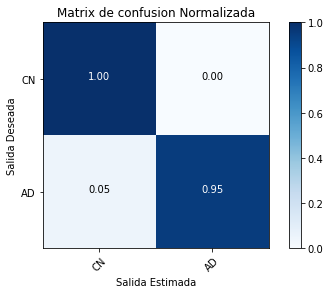

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix3 = confusion_matrix(labelspretest[:,0], labelspretest[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix3, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix3, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
MetricsModel(cnf_matrix3)

Precision CN 0.9615384615384616
Precision AD 1.0
Recall CN: 1.0
Recall AD: 0.95
f1 CN 0.9803921568627451
f1 AD 0.968627450980392


### **Training Model from scratch**

In [ ]:
!clinicadl train image cnn drive/MyDrive/CNN/ADNIcaps t1-linear drive/MyDrive/CNN/labels/train drive/MyDrive/CNN/results/image_cnn Conv5_FC3 --n_splits 4 --diagnoses AD CN --epochs 60 -v

2021-05-14 06:22:15,740 - main process - Path of json file: drive/MyDrive/CNN/results/image_cnn/commandline.json
2021-05-14 06:22:16,763 - main process - Fold 0
2021-05-14 06:22:17,066 - main process - Initialization of the model
2021-05-14 06:22:21,400 - main process - The model is trained from scratch.
2021-05-14 06:22:22,002 - train - Beginning epoch 0.
2021-05-14 06:24:01,751 - train - image level training accuracy is 0.687516 at the end of iteration 124
2021-05-14 06:24:01,751 - train - image level validation accuracy is 0.533333 at the end of iteration 124
2021-05-14 06:24:05,850 - train - Beginning epoch 1.
2021-05-14 06:25:23,745 - train - image level training accuracy is 0.757016 at the end of iteration 124
2021-05-14 06:25:23,745 - train - image level validation accuracy is 0.645238 at the end of iteration 124
2021-05-14 06:25:27,682 - train - Beginning epoch 2.
2021-05-14 06:26:40,359 - train - image level training accuracy is 0.810606 at the end of iteration 124
2021-05-14 

### **Testing model from scratch**

In [ ]:
!clinicadl classify drive/MyDrive/CNN/ADNIcaps drive/MyDrive/CNN/labels/test/CN.tsv drive/MyDrive/CNN/results/image_cnn testCN --nproc 4 --selection_metrics balanced_accuracy

/usr/local/lib/python3.7/dist-packages/clinicadl/tools/deep_learning/data.py:78: UserWarning: The diagnoses found in the DataFrame {'CN'} only corresponds to one class {0}. If you want to run a binary classification please change the labels involved.
  % (unique_diagnoses, unique_codes))


### **Interpretability model from scratch**

In [ ]:
!clinicadl interpret individual drive/MyDrive/CNN/results/image_cnn interpret1 --tsv_path drive/MyDrive/CNN/labels/test --caps_dir drive/MyDrive/CNN/ADNIcaps --diagnosis AD --selection best_balanced_accuracy --nifti_template drive/MyDrive/CNN/ADNIcaps/subjects/sub-ADNI002S0816/ses-M00/t1_linear/sub-ADNI002S0816_ses-M00_T1w_space-MNI152NLin2009cSym_desc-Crop_res-1x1x1_T1w.nii.gz

### **Interpretability first training (10 epochs)**

Saliency maps of AD images
sub-ADNI010S0829
sub-ADNI068S0109
sub-ADNI011S0183
sub-ADNI062S0793
sub-ADNI022S0219
sub-ADNI067S1185
sub-ADNI035S0341
sub-ADNI002S0816


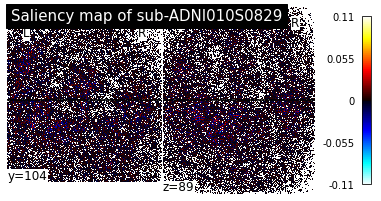

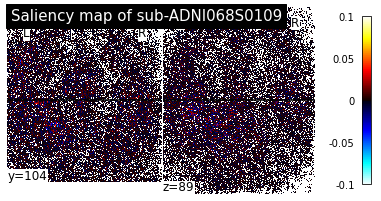

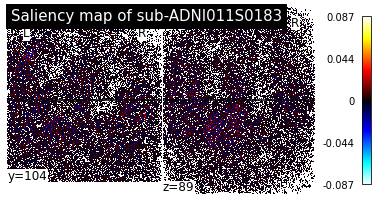

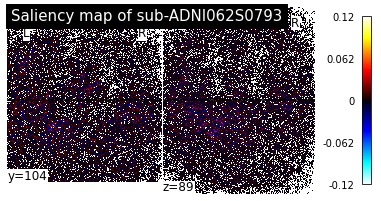

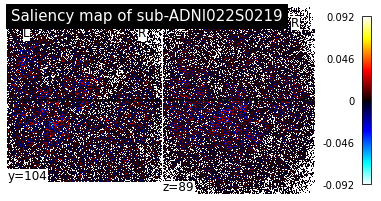

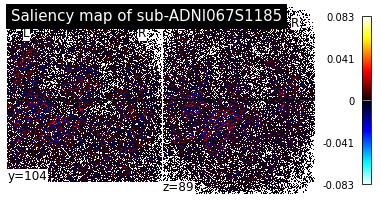

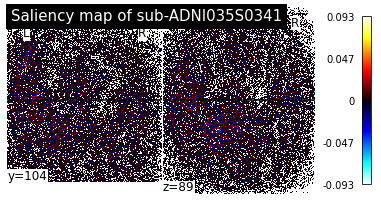

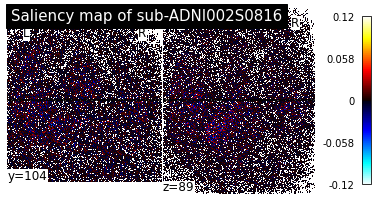

In [ ]:

def plot_individual_maps(diagnosis):

    a = ''
    subjects_path = f"drive/MyDrive/CNN/results/image_cnn/fold-0/gradients/best_balanced_accuracy/interpret1"
    subjects_list = [subject for subject in os.listdir(subjects_path) 
                     if path.isdir(path.join(subjects_path, subject))]
    for subject in subjects_list:
        print(subject)
        subjects_list2 = [subject for subject in os.listdir(f"drive/MyDrive/CNN/results/image_cnn/fold-0/gradients/best_balanced_accuracy/interpret/{subject}") 
                         ]
        if 'ses-M00' in subjects_list2:
            a = 'ses-M00'
        else:
            a = 'ses-M12'
        map_path = path.join(subjects_path, subject, a, "map.nii.gz")
        plotting.plot_stat_map(map_path, title=f"Saliency map of {subject}",
                               cut_coords=(104, 89), display_mode="yz", threshold=10**-3)
    plotting.show()

print("Saliency maps of AD images")
plot_individual_maps("AD")
#104 89 [-5.340576e-5, -15.50005, 10.99995]

### **Glass Brain (maximum intensity values)**

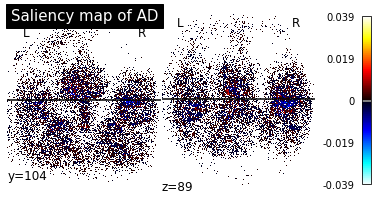

In [ ]:
def plot_individual_maps(diagnosis):
    
    subjects_path = f"drive/MyDrive/CNN/results/image_cnn/fold-3/gradients/best_balanced_accuracy/interpret1"
    map_path = path.join(subjects_path, "map.nii.gz")
    plotting.plot_stat_map(map_path, title=f"Saliency map of {diagnosis}",
                               cut_coords=(104, 89), display_mode="yz", threshold=10**-3)
    plotting.show()

plot_individual_maps("AD")

### **Interpretability second training (60 epochs)**

### **Maps AD**

Interpretability group maps of AD images
sub-ADNI068S0109
sub-ADNI010S0829
sub-ADNI035S0341
sub-ADNI067S1185
sub-ADNI011S0183
sub-ADNI062S0793
sub-ADNI022S0219
sub-ADNI002S0816


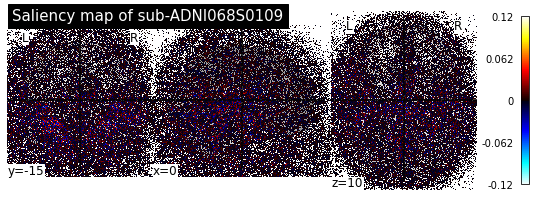

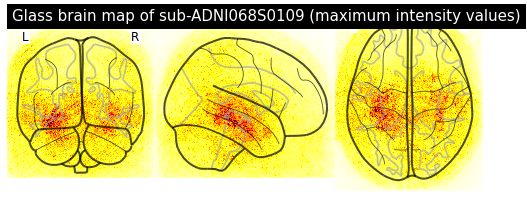

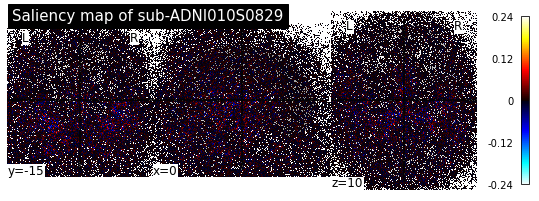

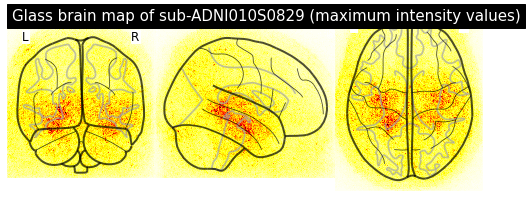

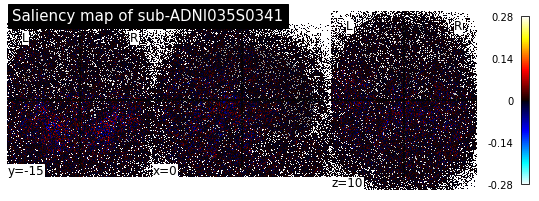

...

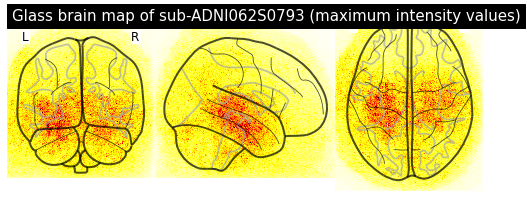

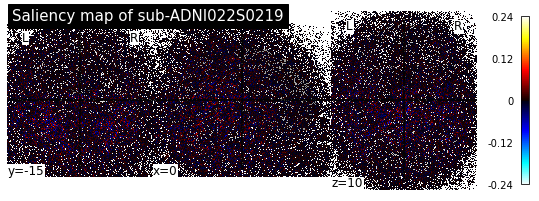

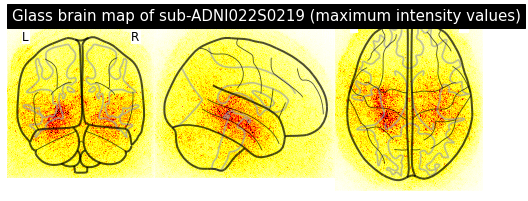

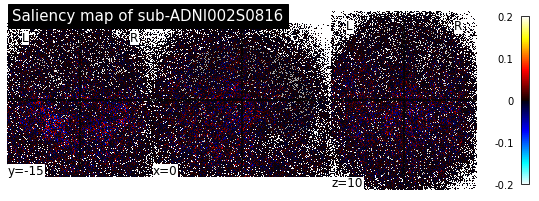

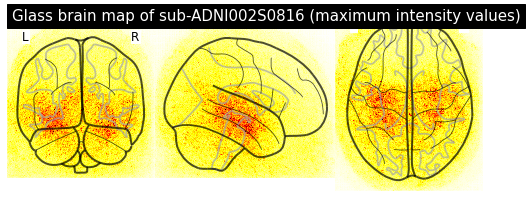

In [ ]:
plot_interpretability_individual_maps('AD','results','image_cnn','interpret1')

Interpretability group maps of AD images


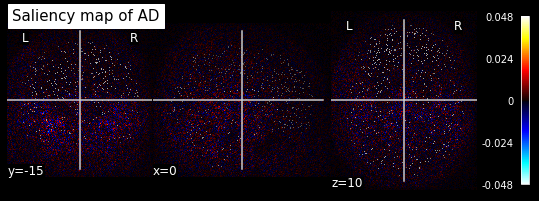

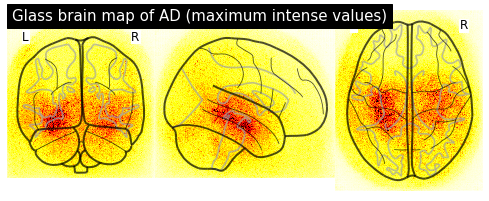

In [ ]:
plot_interpretability_group_maps('AD','results','image_cnn','interpret')

### **Maps CN**

Interpretability group maps of CN images
sub-ADNI023S0963
sub-ADNI006S0498
sub-ADNI116S0648
sub-ADNI073S0386
sub-ADNI126S0506
sub-ADNI006S0484
sub-ADNI009S0751
sub-ADNI022S0066


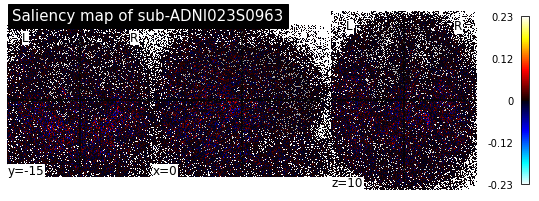

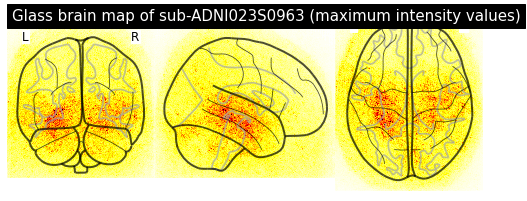

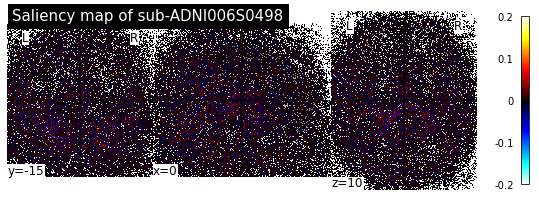

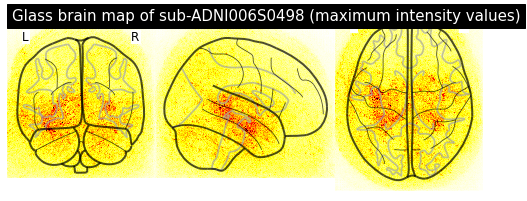

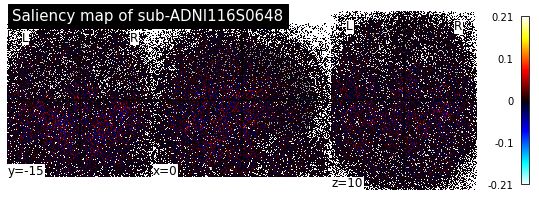

...

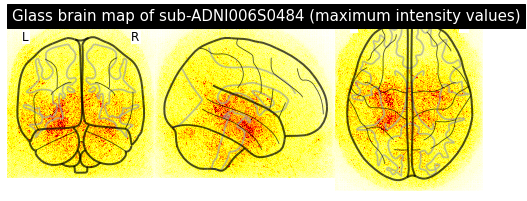

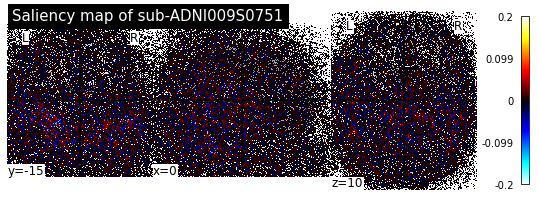

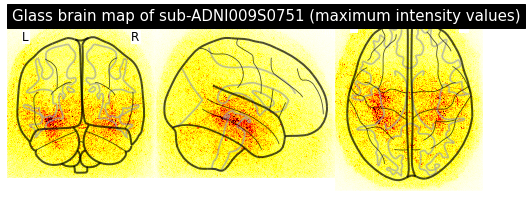

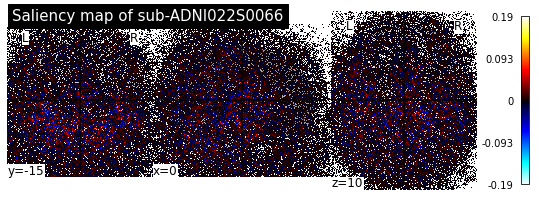

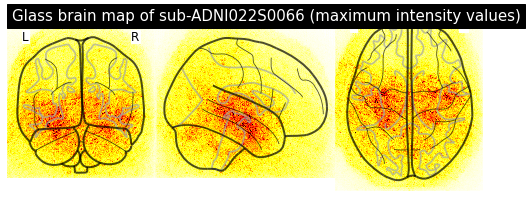

In [ ]:
plot_interpretability_individual_maps('CN','results','image_cnn','interpretCNi')

Interpretability group maps of CN images


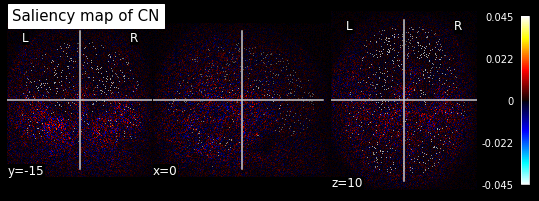

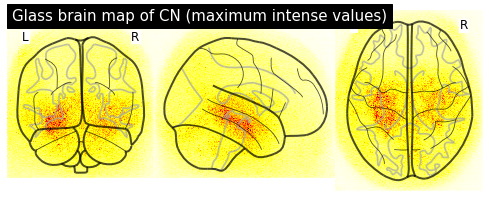

In [ ]:
plot_interpretability_group_maps('CN','results','image_cnn','interpretCNg')

### **Metrics Model from scratch**

In [ ]:
labelstest11 = ExtractLabelsArray('results', 'image_cnn','fold-0','testAD_image_level_prediction')
labelstest22 = ExtractLabelsArray('results', 'image_cnn', 'fold-0','testCN_image_level_prediction')
labelsscratchtest = np.concatenate((labelstest11,labelstest22),axis = 0)

print(labelsscratchtest)

['participant_id', 'session_id', 'true_label', 'predicted_label']
['sub-ADNI011S0183', 'ses-M00', '1', '1']
['sub-ADNI011S0183', 'ses-M06', '1', '1']
['sub-ADNI011S0183', 'ses-M12', '1', '1']
['sub-ADNI011S0183', 'ses-M24', '1', '1']
['sub-ADNI035S0341', 'ses-M00', '1', '1']
['sub-ADNI035S0341', 'ses-M06', '1', '1']
['sub-ADNI010S0829', 'ses-M12', '1', '1']
['sub-ADNI010S0829', 'ses-M24', '1', '1']
['sub-ADNI062S0793', 'ses-M12', '1', '0']
['sub-ADNI062S0793', 'ses-M24', '1', '1']
['sub-ADNI002S0816', 'ses-M06', '1', '1']
['sub-ADNI002S0816', 'ses-M00', '1', '1']
['sub-ADNI002S0816', 'ses-M12', '1', '1']
['sub-ADNI068S0109', 'ses-M00', '1', '1']
['sub-ADNI068S0109', 'ses-M06', '1', '1']
['sub-ADNI068S0109', 'ses-M12', '1', '1']
['sub-ADNI068S0109', 'ses-M24', '1', '1']
['sub-ADNI067S1185', 'ses-M00', '1', '1']
['sub-ADNI067S1185', 'ses-M06', '1', '1']
['sub-ADNI022S0219', 'ses-M00', '1', '1']
[[1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 0.]
 [1. 1.]
 [1.

In [ ]:
labelsscratchtrain = ExtractLabelsArray('results','image_cnn', 'fold-0','train_image_level_prediction')
labelsscratchval = ExtractLabelsArray('results','image_cnn', 'fold-0','validation_image_level_prediction')

['participant_id', 'session_id', 'true_label', 'predicted_label']
['sub-ADNI027S0120', 'ses-M12', '0', '0']
['sub-ADNI037S0327', 'ses-M06', '0', '0']
['sub-ADNI013S1276', 'ses-M24', '0', '0']
['sub-ADNI018S0286', 'ses-M24', '1', '1']
['sub-ADNI031S0618', 'ses-M00', '0', '0']
['sub-ADNI022S0543', 'ses-M24', '1', '1']
['sub-ADNI053S1044', 'ses-M06', '1', '1']
['sub-ADNI021S0753', 'ses-M24', '1', '1']
['sub-ADNI005S1341', 'ses-M24', '1', '1']
['sub-ADNI002S1018', 'ses-M24', '1', '1']
['sub-ADNI031S0554', 'ses-M12', '1', '1']
['sub-ADNI031S0554', 'ses-M06', '1', '1']
['sub-ADNI027S0120', 'ses-M00', '0', '0']
['sub-ADNI023S0083', 'ses-M12', '1', '1']
['sub-ADNI022S0130', 'ses-M06', '0', '0']
['sub-ADNI123S0094', 'ses-M06', '1', '1']
['sub-ADNI098S0172', 'ses-M06', '0', '0']
['sub-ADNI005S0814', 'ses-M24', '1', '1']
['sub-ADNI068S0473', 'ses-M06', '0', '0']
['sub-ADNI094S1164', 'ses-M12', '1', '1']
['sub-ADNI002S1018', 'ses-M00', '1', '1']
['sub-ADNI123S0072', 'ses-M12', '0', '0']
['sub-ADNI

### **Train Data**

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


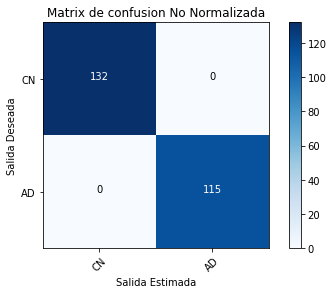

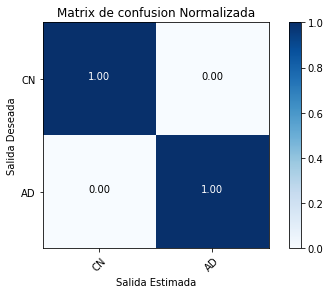

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix5 = confusion_matrix(labelsscratchtrain[:,0], labelsscratchtrain[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix5, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix5, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
MetricsModel(cnf_matrix5)

Precision CN 1.0
Precision AD 1.0
Recall CN: 1.0
Recall AD: 1.0
f1 CN 1.0
f1 AD 1.0


### **Validation Data**

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


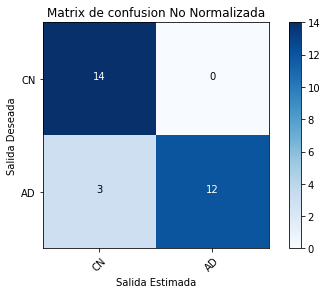

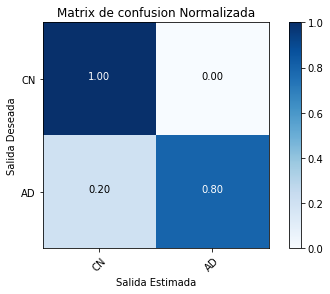

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix6 = confusion_matrix(labelsscratchval[:,0], labelsscratchval[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix6, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix6, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
MetricsModel(cnf_matrix6)

Precision CN 0.8235294117647058
Precision AD 1.0
Recall CN: 1.0
Recall AD: 0.8
f1 CN 0.9032258064516129
f1 AD 0.8774193548387097


### **Test Data**

Matrix de confusion No Normalizada
 Matrix de confusion Normalizada 


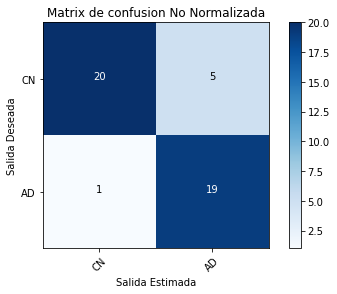

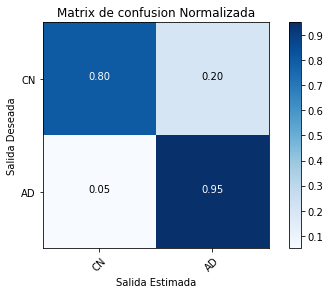

In [ ]:
class_names=['CN', 'AD']    


# Compute confusion matrix
cnf_matrix4 = confusion_matrix(labelsscratchtest[:,0], labelsscratchtest[:,1])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix4, classes=class_names,
                      title='Matrix de confusion No Normalizada')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix4, classes=class_names, normalize=True,
                      title='Matrix de confusion Normalizada')

plt.show()

In [ ]:
MetricsModel(cnf_matrix4)

Precision CN 0.9523809523809523
Precision AD 0.7916666666666666
Recall CN: 0.8
Recall AD: 0.95
f1 CN 0.8695652173913043
f1 AD 0.8583559782608694


### **New data**

In [ ]:
!curl -k https://aramislab.paris.inria.fr/files/data/databases/tuto/OasisCaps2.tar.gz -o OasisCaps2.tar.gz
!tar xf OasisCaps2.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  420M  100  420M    0     0  49.5M      0  0:00:08  0:00:08 --:--:-- 54.3M


In [ ]:
!curl -k https://aramislab.paris.inria.fr/files/data/databases/tuto/OasisBids.tar.gz -o OasisBids.tar.gz
!tar xf OasisBids.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 23.1M  100 23.1M    0     0  38.4M      0 --:--:-- --:--:-- --:--:-- 38.4M


In [ ]:
!clinica iotools merge-tsv OasisBids_example OasisCaps_example/participants.tsv

[Warning] The PYTHONPATH environment variable is not empty. Make sure there is no interference with Clinica (content of PYTHONPATH: /env/python).


In [ ]:
!clinicadl classify OasisCaps_example OasisCaps_example/participants.tsv drive/MyDrive/CNN/results1/image_cnn1 testOasis --nproc 4 --selection_metrics balanced_accuracy

In [ ]:
!clinicadl classify OasisCaps_example OasisCaps_example/participants.tsv drive/MyDrive/CNN/results/image_cnn testOasis --nproc 4 --selection_metrics balanced_accuracy

In [ ]:
import torch

In [ ]:
b = torch.load('OasisCaps_example/subjects/sub-OASIS10016/ses-M00/deeplearning_prepare_data/image_based/t1_linear/sub-OASIS10016_ses-M00_T1w_space-MNI152NLin2009cSym_desc-Crop_res-1x1x1_T1w.pt')
a = torch.load('OasisCaps_example/subjects/sub-OASIS10109/ses-M00/deeplearning_prepare_data/image_based/t1_linear/sub-OASIS10109_ses-M00_T1w_space-MNI152NLin2009cSym_desc-Crop_res-1x1x1_T1w.pt')

In [ ]:
a.shape

torch.Size([1, 169, 208, 179])

In [ ]:
b[-1,-1,0]

tensor([-0.0000e+00, -0.0000e+00, -0.0000e+00,  0.0000e+00,  0.0000e+00,
        -0.0000e+00,  0.0000e+00, -0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -0.0000e+00,
        -2.8026e-45, -7.0065e-45, -1.1210e-44,  1.4013e-45, -2.2421e-44,
         2.8026e-44, -7.0065e-45, -2.2000e-43,  8.9683e-44,  3.5032e-43,
        -3.2468e-42, -5.2226e-42, -5.5085e-42,  4.2497e-41,  1.4880e-40,
        -1.0676e-40, -3.9334e-41,  2.9175e-40, -2.6202e-40, -9.1520e-40,
        -1.9301e-39,  2.3011e-39, -4.6780e-40, -2.4381e-39,  1.3811e-38,
         3.7595e-38, -1.5597e-38, -1.8508e-37, -1.2973e-37,  1.6520e-37,
        -1.9815e-37,  5.1289e-37, -6.5873e-37,  3.4756e-36, -1.1204e-35,
         1.3408e-35, -1.1899e-35,  2.2073e-35, -1.0307e-35, -1.5165e-34,
         2.4033e-34, -3.4533e-34,  2.4531e-35, -1.4484e-33,  1.3712e-33,
         3.8079e-34,  2.1222e-33,  2.6641e-33,  4.8959e-33, -1.3815e-34,
        -2.2489e-32, -2.6898e-32, -4.0153e-33, -1.5